## MGC-BioSB Spatial Omics Analysis
### Practical 2: Imaging-based spatial transcriptomics data QC and normalization 
Date: 10-11-2025

Author(s): Myrthe van Baardwijk

Author(s) email: <m.vanbaardwijk@erasmusmc.nl>

In this practical, we will look into the first steps of analyzing a dataset from the imaging-based sequencing platform Xenium. We will go through the following steps:
1. Loading data
2. Data exploration
3. Quality control
4. Normalization
5. Filtering
6. Dimensionality reduction & clustering
7. Marker gene identification

## Loading packages


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scipy.sparse as sp
from scipy.stats import gaussian_kde
import tenx_method_nb_helper_functions as hf
from scipy import sparse
import igraph

/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe

## Dataset description

The dataset used in this practical is the brain hemisphere of an adult mouse analyzed using the Xenium In Situ platform. Specifically, this sample is of a well-characterized transgenic Alzheimer's Disease model at the age of 17.9 months.

The data was retrieved from https://cf.10xgenomics.com/samples/xenium/1.4.0/Xenium_V1_FFPE_TgCRND8_17_9_months/Xenium_V1_FFPE_TgCRND8_17_9_months_outs.zip.

More information on this dataset can be found at https://pages.10xgenomics.com/rs/446-PBO-704/images/10x_LIT000210_App-Note_Xenium-In-Situ_Letter_Digital.pdf and https://www.10xgenomics.com/datasets/xenium-in-situ-analysis-of-alzheimers-disease-mouse-model-brain-coronal-sections-from-one-hemisphere-over-a-time-course-1-standard.

## 1. Loading data
We will start from Xenium data where image processing and molecule decoding has already been performed by the Xenium platform. We will load data in `annData` format, which is a widely used format for single-cell and spatial transcriptomics data in Python. For practical purposes, we have previously created the annData object for you, which can be loaded using the `read_h5ad` function from Scanpy.

In [2]:
adata = sc.read_h5ad("/mnt/SCS/data_2/Users/Myrthe/Courses/BioSB-spatial-omics/session-imaging-based-data-analysis/xenium_mouse_tgCRND8_17.9.h5ad")
adata

AnnData object with n_obs × n_vars = 62268 × 347
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

If in the future you would like to start from the Xenium platform output, the following block of code can be used to create an annData object from that output. More information on the output structure and individual output files can be found here: https://www.10xgenomics.com/support/software/xenium-onboard-analysis/latest/analysis/xoa-output-understanding-outputs.

In [3]:
# sample_path = "/mnt/SCS/data_2/Users/Myrthe/Courses/BioSB-spatial-omics/session-imaging-based-data-analysis/Data/"
# transcripts_csv_path = os.path.join(sample_path, "transcripts.csv.gz")
# transcripts_df = pd.read_csv(transcripts_csv_path, compression='gzip')
# nucleus_boundaries_gz_path = os.path.join(sample_path, "nucleus_boundaries.csv.gz")
# nucleus_df = pd.read_csv(nucleus_boundaries_gz_path, compression='gzip')
# if not os.path.exists(os.path.join(sample_path, "cells.csv")):
#     hf.decompress_file(os.path.join(sample_path, "cells.csv.gz"))
# adata = hf.create_adata(sample_path, nucleus_genes_only = False)

## 2. Data exploration

Before diving into the analysis, it is important to get familiarized with how this data is structured and what our sample looks like.

### 2.1 Data structure

The `AnnData` object, `adata`, contains a structured dataset with cells as observations (`n_obs = 36602`) and genes as variables (`n_vars = 248`). Here's a breakdown of the main components within `adata`:

In [4]:
adata.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,total_counts,cell_area,nucleus_area
aaabiggh-1,aaabiggh-1,831.785336,755.803772,554,0,0,0,554,509.091563,65.386250
aaacfoel-1,aaacfoel-1,821.733453,768.910446,291,0,0,0,291,275.498281,36.982969
aaaeefil-1,aaaeefil-1,831.932053,780.367651,220,1,0,0,221,261.635312,15.849844
aaaehidd-1,aaaehidd-1,853.614108,774.764157,1029,0,0,0,1029,818.547344,129.056563
aaagcbkg-1,aaagcbkg-1,821.639603,799.171515,453,0,0,1,454,522.232031,96.002188
...,...,...,...,...,...,...,...,...,...,...
oindmjog-1,oindmjog-1,5068.380664,4446.804883,35,0,0,0,35,229.709844,15.985312
oinecaba-1,oinecaba-1,5072.841504,4459.385132,124,0,0,0,124,359.353438,18.423750
oinehfmf-1,oinehfmf-1,5251.196240,4366.193091,15,0,0,0,15,686.329844,24.745625
oinemiil-1,oinemiil-1,5248.493506,4382.190356,22,0,0,0,22,333.478906,20.681562


`obs` (Observations): This table contains metadata about each cell, where each row corresponds to a cell, and each column holds information about a specific attribute:

- `cell_id`: Unique identifier for each cell.
  
- `x_centroid` and `y_centroid`: Coordinates of each cell’s center in the spatial layout, indicating where each cell is located within the tissue.
  
- `transcript_counts`: Total transcript counts for each cell, showing the overall gene expression level.
- `control_probe_counts` and `control_codeword_counts`: Counts related to control probes and codewords, which are often used for quality control in spatial transcriptomics.
- `unassigned_codeword_counts` and `deprecated_codeword_counts`: Counts of unassigned or deprecated codewords, indicating low-confidence or outdated identifiers.
- `total_counts`: Total counts across all measured attributes, representing the cell’s total signal.
- `cell_area` and `nucleus_area`: Physical measurements of the cell and its nucleus area, in pixels or micrometers.

In [5]:
adata.var

,gene_ids,feature_types,genome
2010300C02Rik,ENSMUSG00000026090,Gene Expression,Unknown
Abca7,ENSMUSG00000035722,Gene Expression,Unknown
Acsbg1,ENSMUSG00000032281,Gene Expression,Unknown
Acta2,ENSMUSG00000035783,Gene Expression,Unknown
Acvrl1,ENSMUSG00000000530,Gene Expression,Unknown
...,...,...,...
Vwc2l,ENSMUSG00000045648,Gene Expression,Unknown
Wfs1,ENSMUSG00000039474,Gene Expression,Unknown
Zfp366,ENSMUSG00000050919,Gene Expression,Unknown
Zfp536,ENSMUSG00000043456,Gene Expression,Unknown


`var` (Variables): This table contains metadata about each gene, where each row is a gene and each column is an attribute:

- `gene_ids`: Unique identifiers for each gene, often in Ensembl or another standardized format.
  
- `feature_types`: Type of feature associated with each gene, such as "gene" or "transcript."
  
- `genome`: Information about the genome source of each gene, like "human" or "mouse."

In [6]:
adata.obsm

AxisArrays with keys: spatial

In [7]:
adata.obsm['spatial']

array([[ 831.7853363 ,  755.80377197],
       [ 821.73345337,  768.91044617],
       [ 831.93205261,  780.36765137],
       ...,
       [5251.19624023, 4366.19309082],
       [5248.49350586, 4382.19035645],
       [5272.02331543, 4387.36962891]], shape=(62268, 2))

`obsm` (Multi-dimensional Observations): This slot contains multi-dimensional data related to cells. Here, `spatial` stores spatial coordinates for each cell, allowing visualization and spatial analysis of cells in their tissue context.

### 2.2 Gene expression data

Here we will take a first look at the gene expression levels in our dataset. Note that we will still have to go through the processes of quality control and normalization before we can draw any conclusions from this, but this will help you get a better feeling of the dataset.

We can identify the genes with the highest expression across the dataset using the `pl.highest_expr genes` function from scanpy. These genes are often essential housekeeping genes or specific markers defining particular cell types. You can also spot from this figure that there are outlier cells where all transcripts measured come from a single gene (100% of total counts).

/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)


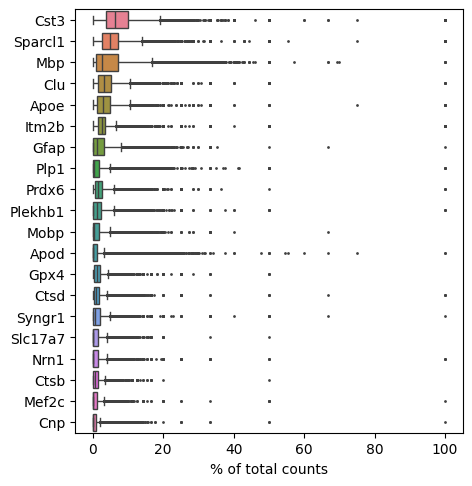

In [8]:
sc.pl.highest_expr_genes(adata, n_top=20)

Now we will look at the gene expression levels in space. This gives us an impression of the spatial distribution of the expression of genes. In this example, I took the top 3 highly expressed genes from the plot above, but feel free to try out other genes as well.

/tmp/ipykernel_1038681/2030588361.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=example_genes, spot_size=10, cmap='viridis_r')


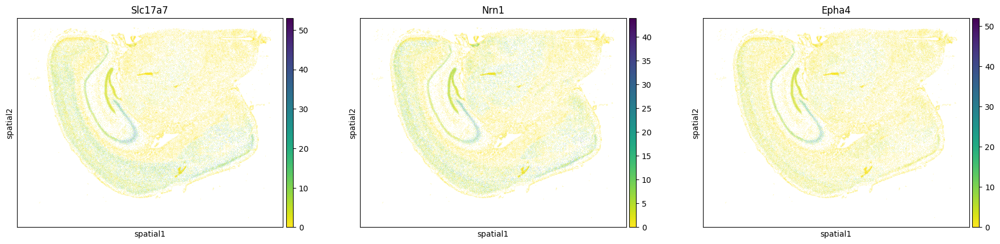

In [9]:
example_genes = ['Slc17a7', 'Nrn1', 'Epha4']
sc.pl.spatial(adata, color=example_genes, spot_size=10, cmap='viridis_r')

## 3. Quality control (QC)

Quality control aims to evaluate the overall detection quality by the platform and identify low-quality regions needed to be filtered out before downstream analysis. In imaging-based spatial transcriptomics, this involves checks on both the level of the transcripts as the morphological level.

### 3.1 Detection statistics
In the first part of the QC we are going to dive into the efficiency of the detection of the transcripts. We will calculate the following metrics and study their distributions:
- Number of transcripts detected per cell
- Number of unique genes detected per cell

These provide a measure of each cell's transcriptional activity or RNA content. Examining these distributions will give us an overview of the data quality and cellular diversity and identify potential outliers:
- Cells with Very **Low** Counts: These may represent low-quality cells or background noise, which could be filtered out in subsequent steps to improve analysis accuracy.
- Cells with Very **High** Counts: High total counts may indicate cell types with naturally high transcriptional activity or potential doublets (two cells counted as one).

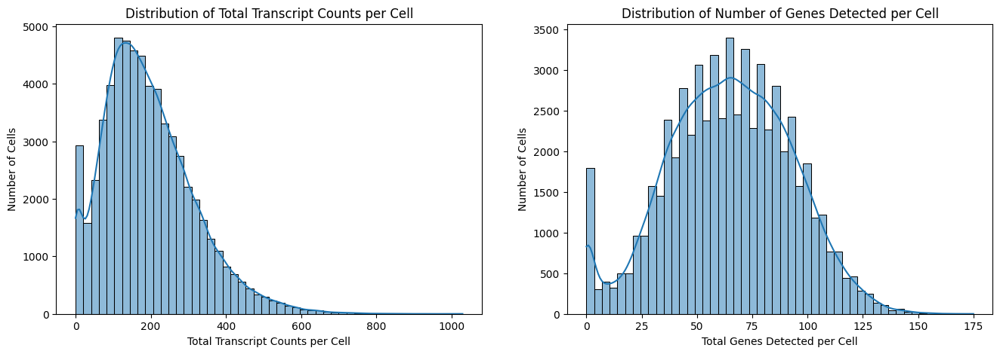

In [10]:
# Calculate total counts and number of genes detected per cell
adata.obs['total_counts'] = adata.X.sum(axis=1)
adata.obs['n_genes'] = (adata.X > 0).sum(axis=1)

# Plot distributions of total counts and number of genes detected per cell side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sns.histplot(adata.obs['total_counts'], bins=50, ax=axes[0], kde=True)
axes[0].set_title('Distribution of Total Transcript Counts per Cell')
axes[0].set_xlabel("Total Transcript Counts per Cell")
axes[0].set_ylabel("Number of Cells")
sns.histplot(adata.obs['n_genes'], bins=50, ax=axes[1], kde=True)
axes[1].set_title('Distribution of Number of Genes Detected per Cell')
axes[1].set_xlabel("Total Genes Detected per Cell")
axes[1].set_ylabel("Number of Cells")
plt.show()

We can also look at the spatial distribution of these metrics to identify regions of low-quality.

/tmp/ipykernel_1038681/2042597367.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='total_counts', spot_size=10, title="Spatial Distribution of Total Transcript Counts", cmap='viridis_r', show=False, ax=axes[0])
/tmp/ipykernel_1038681/2042597367.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='n_genes', spot_size=10, title="Spatial Distribution of Number of Genes Detected per Cell", cmap='viridis_r', show=False, ax=axes[1])


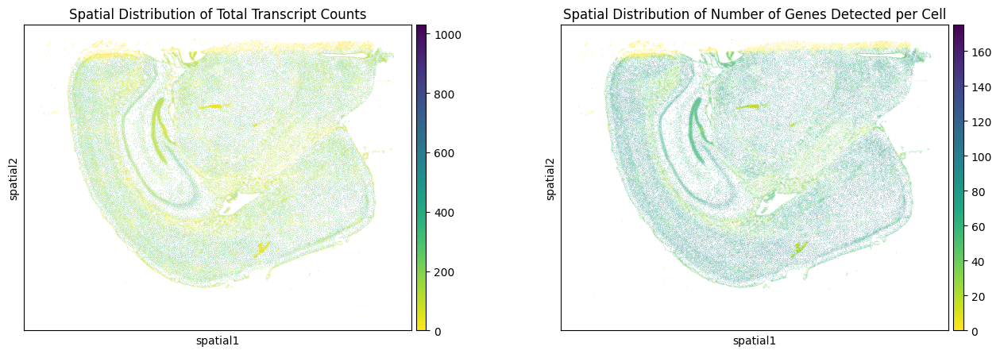

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sc.pl.spatial(adata, color='total_counts', spot_size=10, title="Spatial Distribution of Total Transcript Counts", cmap='viridis_r', show=False, ax=axes[0])
sc.pl.spatial(adata, color='n_genes', spot_size=10, title="Spatial Distribution of Number of Genes Detected per Cell", cmap='viridis_r', show=False, ax=axes[1])
plt.show()

### 3.2 Segmentation statistics

In the second part of the QC we look into the quality of the segmentation process, as segmentation quality directly affects assignment of transcripts to cells. We will inspect the following metrics:
- Cell area (size)
- Nucleus area (size)

Unusual **small** areas could indicate partial cells or segmentation errors, whereas **large** areas could indicate doublets or multiplets of cells.

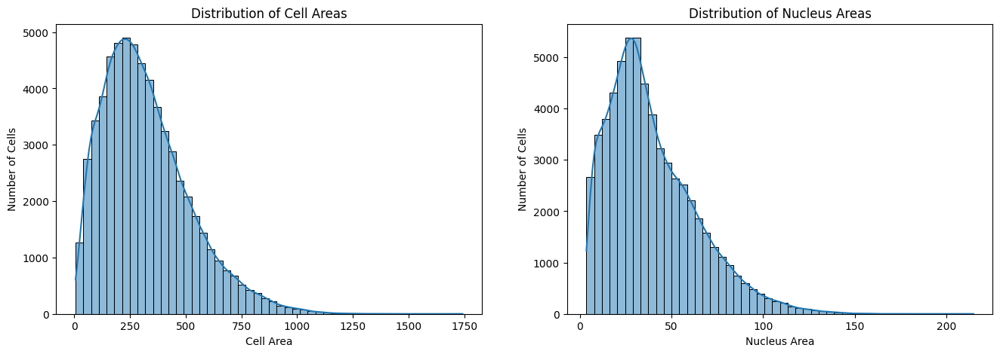

In [12]:
# Plot distributions of cell and nucleus areas side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sns.histplot(adata.obs['cell_area'], bins=50, ax=axes[0], kde=True)
axes[0].set_title('Distribution of Cell Areas')
axes[0].set_xlabel("Cell Area")
axes[0].set_ylabel("Number of Cells")
sns.histplot(adata.obs['nucleus_area'], bins=50, ax=axes[1], kde=True)
axes[1].set_title('Distribution of Nucleus Areas')
axes[1].set_xlabel("Nucleus Area")
axes[1].set_ylabel("Number of Cells")
plt.show()

In addition, plotting the nucleus area against the corresponding cell area helps further evaluate segmentation quality. In well-segmented data, we expect a positive relationship where large cells generally have larger nuclei. Strong deviations from this pattern can indicate segmentation errors, debris or merged cells.

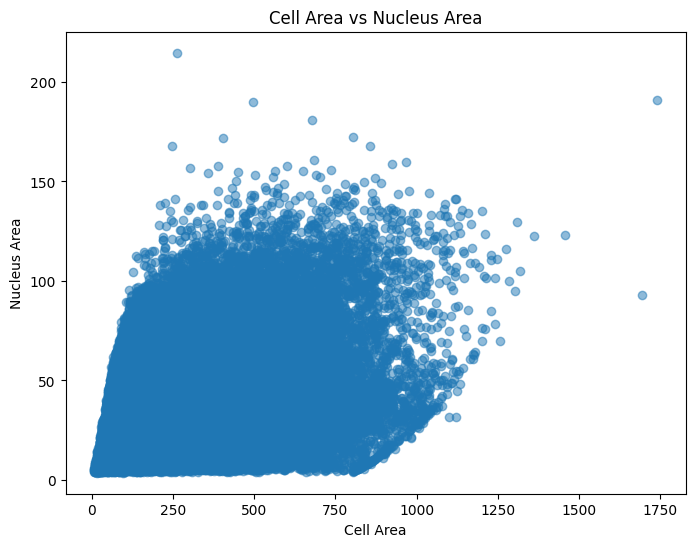

In [13]:
# Plot nucleus area against cell area
plt.figure(figsize=(8, 6))
plt.scatter(adata.obs['cell_area'], adata.obs['nucleus_area'], alpha=0.5)
plt.xlabel("Cell Area")
plt.ylabel("Nucleus Area")
plt.title("Cell Area vs Nucleus Area")
plt.show()

To further quantify this relationship, we calculate the cell-to-nucleus area ratio and visualize its distribution. This ratio reflects the relative size of the nucleus compared to the entire cell, which can be informative for understanding cell morphology and the distribution of nuclear material within cells. A high ratio may indicate cells with large nuclei relative to their overall size, which could be relevant for cell type classification or biological interpretation. Examining this ratio helps identify potential outliers or unusual cell morphologies that may require further investigation or filtering.

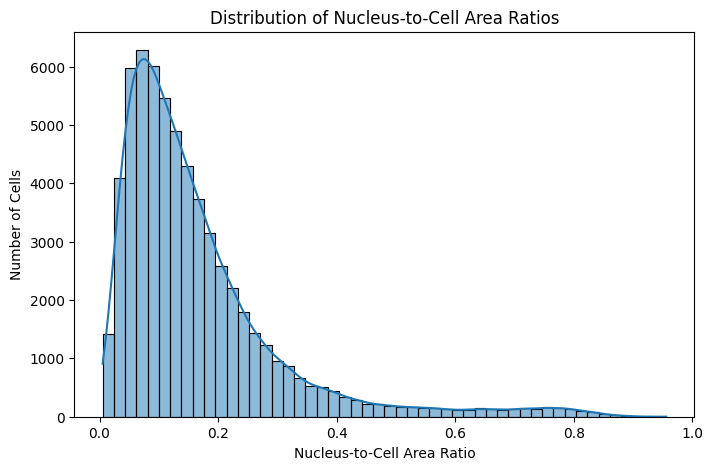

In [14]:
# Calculate nucleus-to-cell area ratio and plot its distribution
adata.obs['area_ratio'] = adata.obs['nucleus_area'] / adata.obs['cell_area']
plt.figure(figsize=(8, 5))
sns.histplot(adata.obs['area_ratio'], kde=True, bins=50)
plt.xlabel("Nucleus-to-Cell Area Ratio")
plt.ylabel("Number of Cells")
plt.title("Distribution of Nucleus-to-Cell Area Ratios")
plt.show()

We can also look at the cell area against the total counts, as we would normally expect to detect more transcripts in larger cell areas. This is also dependent on whether the probeset covers all celltypes within the tissue well. In this dataset, you can observe quite a few large segmented areas with very low counts, most likely low quality regions of the tissue.

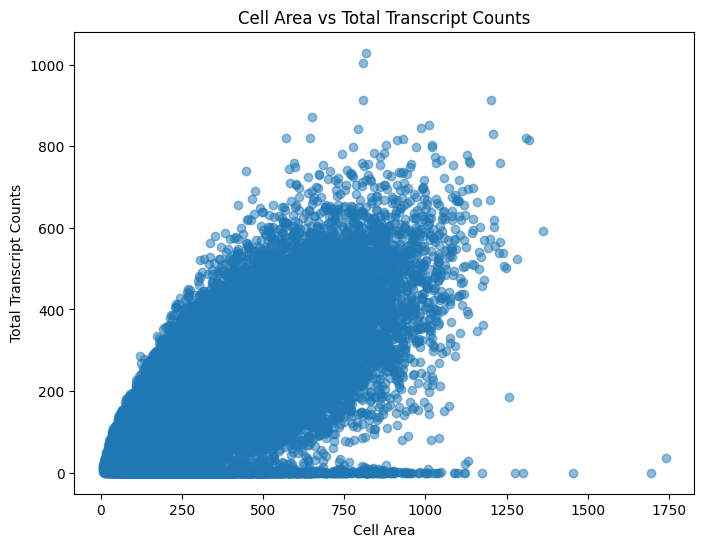

In [15]:
# Plot transcript counts against cell area
plt.figure(figsize=(8, 6))
plt.scatter(adata.obs['cell_area'], adata.obs['total_counts'], alpha=0.5)
plt.xlabel("Cell Area")
plt.ylabel("Total Transcript Counts")
plt.title("Cell Area vs Total Transcript Counts")
plt.show()

Finally, we can visualize the spatial distribution of these metrics as well.

/tmp/ipykernel_1038681/3092704980.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='cell_area', spot_size=10, title="Spatial Distribution of Cell Area", cmap='viridis_r', show=False, ax=axes[0])
/tmp/ipykernel_1038681/3092704980.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='nucleus_area', spot_size=10, title="Spatial Distribution of Nucleus Area", cmap='viridis_r', show=False, ax=axes[1])


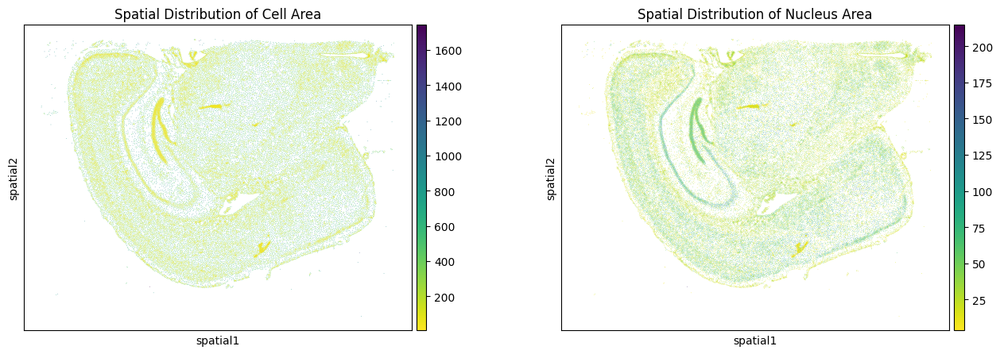

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sc.pl.spatial(adata, color='cell_area', spot_size=10, title="Spatial Distribution of Cell Area", cmap='viridis_r', show=False, ax=axes[0])
sc.pl.spatial(adata, color='nucleus_area', spot_size=10, title="Spatial Distribution of Nucleus Area", cmap='viridis_r', show=False, ax=axes[1])
plt.show()

### 3.3 Control probes and decoding metrics

To assess background noise and technical quality of the dataset we can look at the expression of control probes and the number of unassigned transcripts. Control probes are synthetic sequences added to the experiment to help assess signal quality and specificity. Higher expression of control probes may suggest artifacts or contamination.

Here we visualize the distribution of control probe counts to see how frequently they are detected, as well as the spatial distribution to allow us to see if any regions in the tissue exhibit unexpectedly high control counts potentially indicating technical issues.

/tmp/ipykernel_1038681/4272685074.py:10: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='control_probe_counts', spot_size=10, title="Spatial Distribution of Control Probe Counts", cmap = 'viridis_r', show=False, ax=axes[1])
/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:468: UserWarning: Adding colorbar to a different Figure <Figure size 1600x500 with 3 Axes> than <Figure size 800x500 with 0 Axes> which fig.colorbar is called on.
  plt.colorbar(


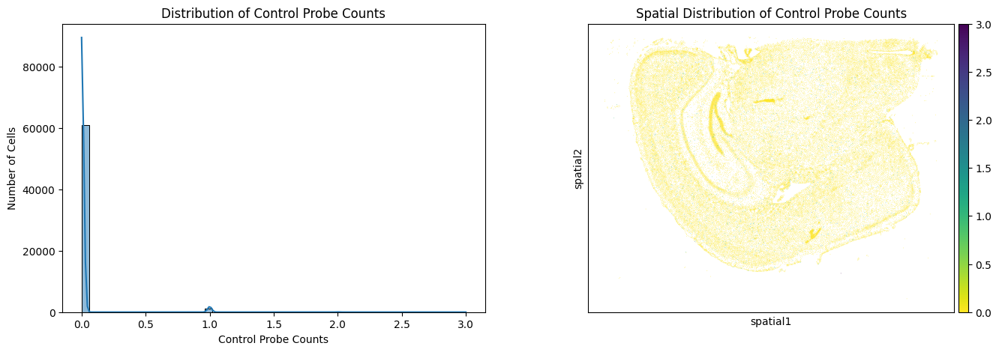

<Figure size 800x500 with 0 Axes>

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
#plot distribution of control probe counts
plt.figure(figsize=(8, 5))
sns.histplot(adata.obs['control_probe_counts'], kde=True, bins=50, ax=axes[0])
axes[0].set_xlabel("Control Probe Counts")
axes[0].set_ylabel("Number of Cells")
axes[0].set_title("Distribution of Control Probe Counts")

#spatial plot of control probe counts
sc.pl.spatial(adata, color='control_probe_counts', spot_size=10, title="Spatial Distribution of Control Probe Counts", cmap = 'viridis_r', show=False, ax=axes[1])
plt.show()

Finally, not all signals detected during imaging can be confidently matched to a known gene resulting in unassigned transcripts. While some level of unassigned transcripts are to be expected, a high level or a spatially clustered pattern could indicate poor hybridization efficiency or local problems.

/tmp/ipykernel_1038681/2790557013.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='unassigned_codeword_counts', spot_size=15, title="Spatial Distribution of Unassigned codeword Counts", cmap='viridis_r')


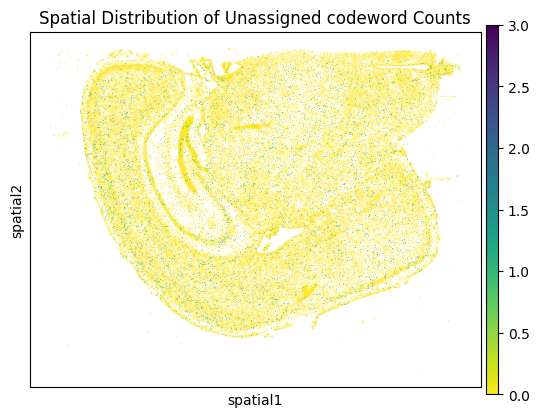

In [18]:
sc.pl.spatial(adata, color='unassigned_codeword_counts', spot_size=15, title="Spatial Distribution of Unassigned codeword Counts", cmap='viridis_r')

## 4. Filtering

After exploring previous quality metrics, we can define filtering thresholds to remove low-quality cells from the data.

Most commonly, the following metrics are considered for filtering:
* Total counts per cell
* Detected genes per cell
* Cell area
* Nuclei area

/tmp/ipykernel_1038681/3150396137.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=['cell_area','nucleus_area'], spot_size=15, color_map = "viridis_r")


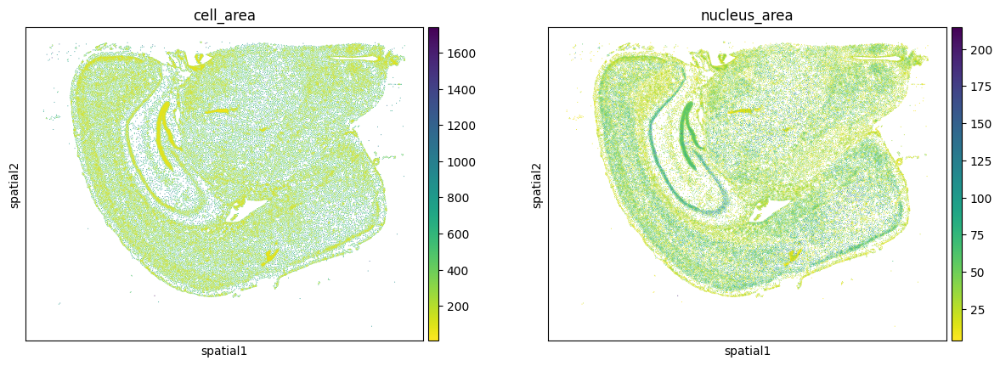

/tmp/ipykernel_1038681/3150396137.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=['total_counts','n_genes'], spot_size=15,  color_map = "viridis_r")


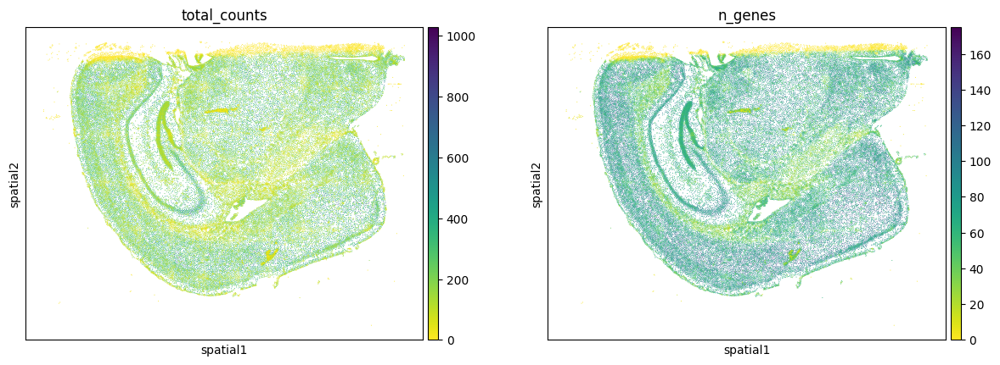

In [19]:
sc.pl.spatial(adata, color=['cell_area','nucleus_area'], spot_size=15, color_map = "viridis_r")
sc.pl.spatial(adata, color=['total_counts','n_genes'], spot_size=15,  color_map = "viridis_r")

As you can see, the top region of the section has very low counts, but still looks normal with regards to segmentation.  There are also a lot of scattered fragments of tissue outside of the secttion. 

In such a case it would be adviced to remove those parts of the section before analysis. If the region clearly deviates in quality we can remove it by simple cutoffs on number of counts and genes, if that is not possible, you may have to manually select the region to remove. For this purpose you would need an interactive browser like Napari. 

### 4.1 Defining cut offs

To decide on cut offs or thresholds for filtering out low-quality spots, we will look at the distribution plots again to determine some possible thresholds. Typically we would like to filter out cells with too few detected genes or transcripts as these are more likely artifacts or regions of low detection quality, but also cells with extremely high counts as these are likely doublets. Filtering is a balance: we would like to remove noise from the data while retaining biological relevant variation. It is therefore important to visualize the impact of our chosen thresholds to ensure we are not removing too much.

We will look at the distribution plot of the total transcripts again to identify potential values for cut-offs and visualize their spatial distribution. 

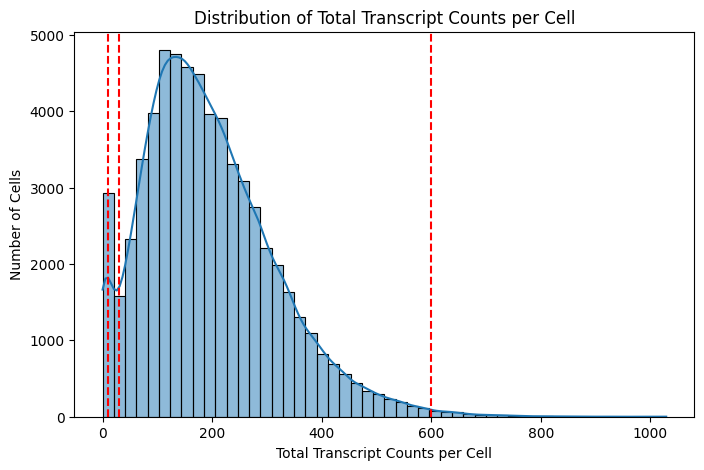

Spots retained after filtering < 10 counts: 96.41%
Spots retained after filtering < 30 counts: 94.37%
Spots retained after filtering > 600 counts: 99.48%


/tmp/ipykernel_1038681/2091014180.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=['min10','min30','max600'], spot_size=15, palette = ["lightgray","blue"])


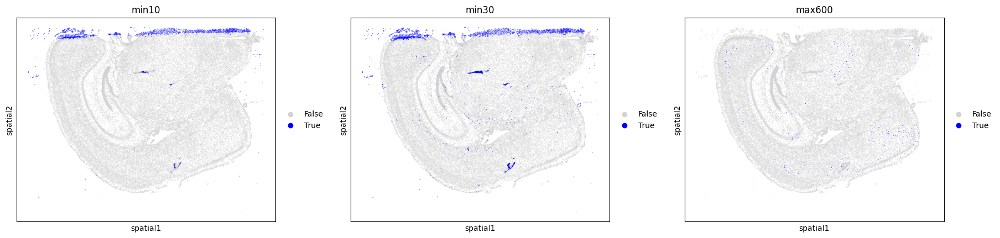

In [20]:
adata.obs['total_counts'] = adata.X.sum(axis=1)
plt.figure(figsize=(8, 5))
sns.histplot(adata.obs['total_counts'], kde='True', bins=50)
plt.axvline(x=10, color='red', linestyle='--')
plt.axvline(x=30, color='red', linestyle='--')
plt.axvline(x=600, color='red', linestyle='--')
plt.xlabel("Total Transcript Counts per Cell")
plt.ylabel("Number of Cells")
plt.title("Distribution of Total Transcript Counts per Cell")
plt.show()

adata.obs['min10'] = adata.obs['total_counts'] < 10
pct_retained = 100 - adata.obs['min10'].mean() * 100
print(f"Spots retained after filtering < 10 counts: {pct_retained:.2f}%")
adata.obs['min30'] = adata.obs['total_counts'] < 30
pct_retained = 100 - adata.obs['min30'].mean() * 100
print(f"Spots retained after filtering < 30 counts: {pct_retained:.2f}%")
adata.obs['max600'] = adata.obs['total_counts'] > 600
pct_retained = 100 - adata.obs['max600'].mean() * 100
print(f"Spots retained after filtering > 600 counts: {pct_retained:.2f}%")

sc.pl.spatial(adata, color=['min10','min30','max600'], spot_size=15, palette = ["lightgray","blue"])

It looks like we get rid of most of the problematic regions with a cutoff of 30 counts minimum. The cells with more than 600 counts are scattered over the tissue, but we will still filter those as well for now.

You can try out different values for the counts and create similar plots for all filtering criteria, if you have time.

### 4.2 Filtering out cells and genes

Lets now remove the low-quality cells and genes from the dataset. We will use keep cells that follow these criteria:
* Total counts > 30 and < 600
* Number of unique genes > 5 and < 150
* Cell area > 20 and < 1000
* Nucleus area > 7

Let's visualize these thresholds and the spatial distribution of the cells removed based on these thresholds.

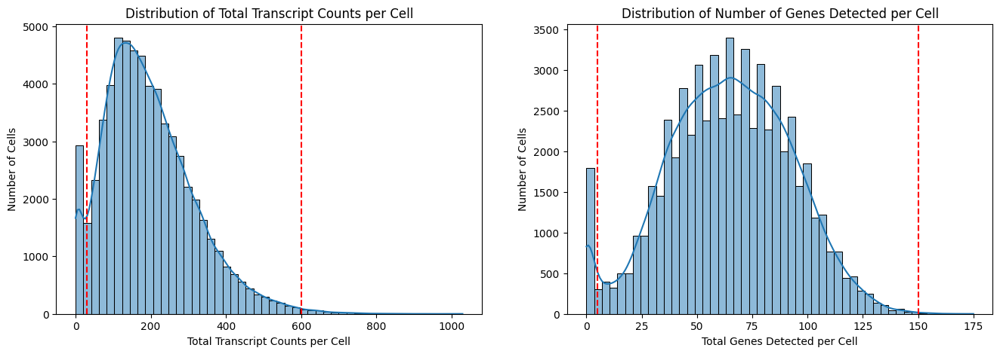

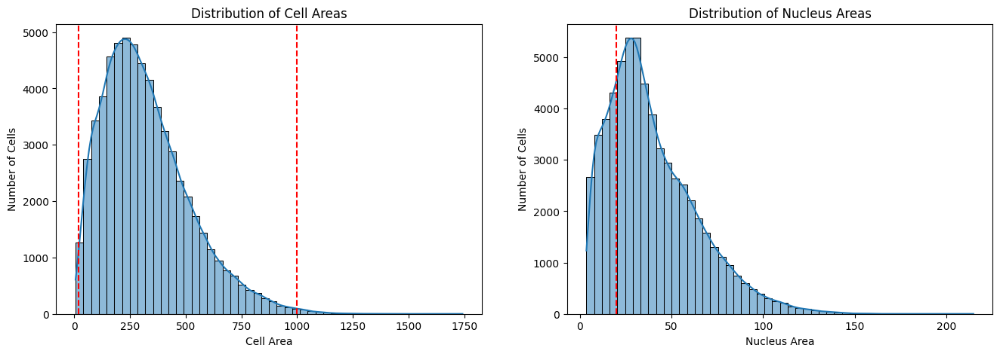

In [21]:
# Plot distributions of total counts and number of genes detected per cell side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sns.histplot(adata.obs['total_counts'], bins=50, ax=axes[0], kde=True)
axes[0].axvline(x=30, color='red', linestyle='--') # add line for min30 counts threshold
axes[0].axvline(x=600, color='red', linestyle='--') # add line for max600 counts threshold
axes[0].set_title('Distribution of Total Transcript Counts per Cell')
axes[0].set_xlabel("Total Transcript Counts per Cell")
axes[0].set_ylabel("Number of Cells")
sns.histplot(adata.obs['n_genes'], bins=50, ax=axes[1], kde=True)
axes[1].axvline(x=5, color='red', linestyle='--') # add line for min5 genes threshold
axes[1].axvline(x=150, color='red', linestyle='--') # add line for max150 genes threshold
axes[1].set_title('Distribution of Number of Genes Detected per Cell')
axes[1].set_xlabel("Total Genes Detected per Cell")
axes[1].set_ylabel("Number of Cells")
plt.show()

# Plot distributions of cell and nucleus areas side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sns.histplot(adata.obs['cell_area'], bins=50, ax=axes[0], kde=True)
axes[0].axvline(x=20, color='red', linestyle='--') # add line for min20 cell area threshold
axes[0].axvline(x=1000, color='red', linestyle='--') # add line for max1000 cell area threshold
axes[0].set_title('Distribution of Cell Areas')
axes[0].set_xlabel("Cell Area")
axes[0].set_ylabel("Number of Cells")
sns.histplot(adata.obs['nucleus_area'], bins=50, ax=axes[1], kde=True)
axes[1].axvline(x=20, color='red', linestyle='--') # add line for min7 nuclei size threshold
axes[1].set_title('Distribution of Nucleus Areas')
axes[1].set_xlabel("Nucleus Area")
axes[1].set_ylabel("Number of Cells")
plt.show()

/tmp/ipykernel_1038681/479255836.py:10: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=['remove_cell'], spot_size=15, palette = ["lightgray","blue"])


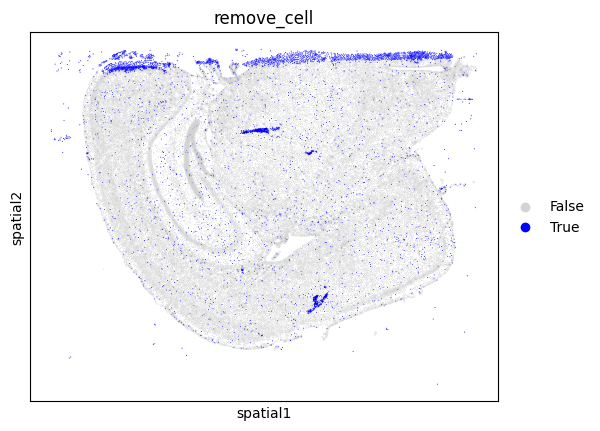

Spots retained after all filter criteria: 91.38%


In [22]:
adata.obs['remove_cell'] = (
    (adata.obs['total_counts'] < 30) |
    (adata.obs['total_counts'] > 600) |
    (adata.obs['n_genes'] < 5) |
    (adata.obs['n_genes'] > 150) |
    (adata.obs['cell_area'] < 20) |
    (adata.obs['cell_area'] > 1000) |
    (adata.obs['nucleus_area'] < 7)
)
sc.pl.spatial(adata, color=['remove_cell'], spot_size=15, palette = ["lightgray","blue"])
pct_retained = 100 - adata.obs['remove_cell'].mean() * 100
print(f"Spots retained after all filter criteria: {pct_retained:.2f}%")

If we are satisfied with these results, we can filter these cells out the dataset using the `sc.pp.filter_cells` function from Scanpy. Note: this function is only for filtering based on counts and numbers of genes expressed. For filtering on the cell area and nucleus area we will use data slicing.

In [23]:
initial_cells_count = adata.n_obs
initial_genes_count = adata.n_vars

# Filtering using Scanpy functions
sc.pp.filter_cells(adata, min_counts=30, inplace=True)
sc.pp.filter_cells(adata, max_counts=600, inplace=True)
sc.pp.filter_cells(adata, min_genes=5, inplace=True)
sc.pp.filter_cells(adata, max_genes=150, inplace=True)

# Filtering using data slicing
adata = adata[adata.obs['cell_area']>20,:]
adata = adata[adata.obs['cell_area']<1000,:]
adata = adata[adata.obs['nucleus_area']>7,:]

# Report number of cells and genes filtered out
filtered_cells_count = adata.n_obs
filtered_genes_count = adata.n_vars
print(f"Filtered {initial_cells_count - filtered_cells_count} (out of intial {initial_cells_count} cells)")
print(f"Filtered {initial_genes_count - filtered_genes_count} (out of intial {initial_genes_count} genes)")


Filtered 5369 (out of intial 62268 cells)
Filtered 0 (out of intial 347 genes)


Let's look at the distributions again after filtering.

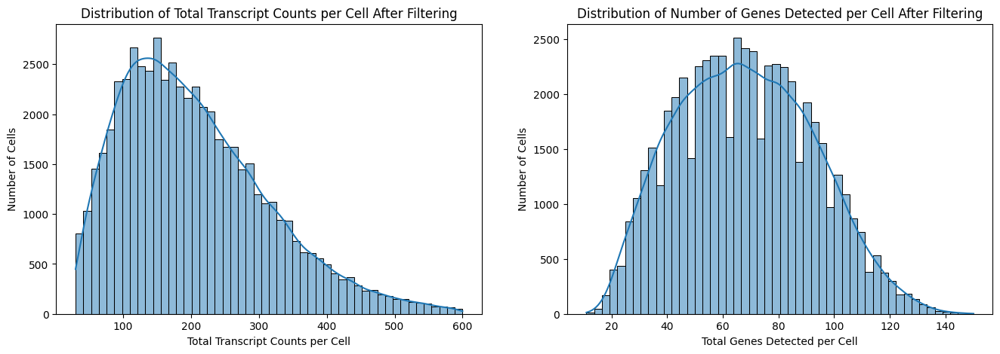

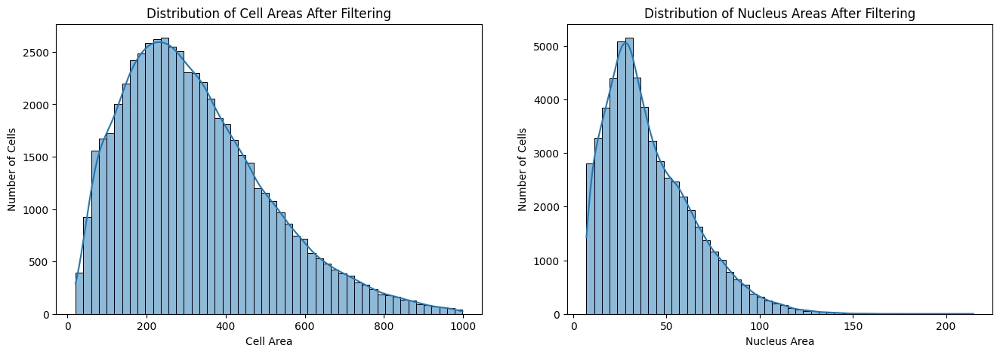

In [24]:
# Plot distributions of total counts and number of genes detected per cell side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sns.histplot(adata.obs['total_counts'], bins=50, ax=axes[0], kde=True)
axes[0].set_title('Distribution of Total Transcript Counts per Cell After Filtering')
axes[0].set_xlabel("Total Transcript Counts per Cell")
axes[0].set_ylabel("Number of Cells")
sns.histplot(adata.obs['n_genes'], bins=50, ax=axes[1], kde=True)
axes[1].set_title('Distribution of Number of Genes Detected per Cell After Filtering')
axes[1].set_xlabel("Total Genes Detected per Cell")
axes[1].set_ylabel("Number of Cells")
plt.show()

# Plot distributions of cell and nucleus areas side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sns.histplot(adata.obs['cell_area'], bins=50, ax=axes[0], kde=True)
axes[0].set_title('Distribution of Cell Areas After Filtering')
axes[0].set_xlabel("Cell Area")
axes[0].set_ylabel("Number of Cells")
sns.histplot(adata.obs['nucleus_area'], bins=50, ax=axes[1], kde=True)
axes[1].set_title('Distribution of Nucleus Areas After Filtering')
axes[1].set_xlabel("Nucleus Area")
axes[1].set_ylabel("Number of Cells")
plt.show()

If we plot the top expressed genes again, we will see that these are still the same genes but there are no longer genes which make up 100% of the transcripts in any cell.

/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


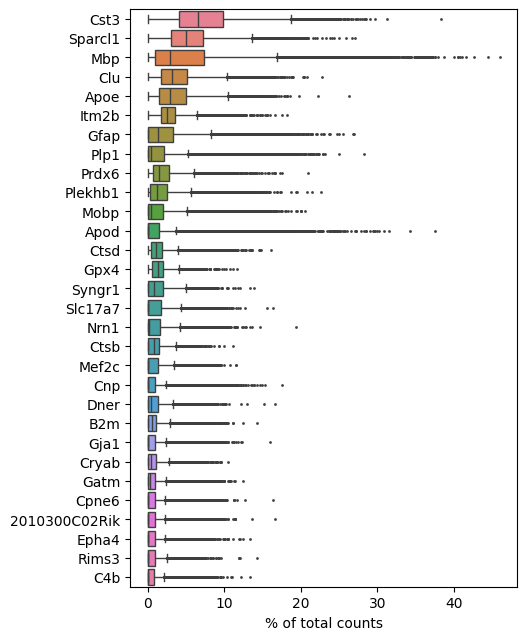

In [25]:
sc.pl.highest_expr_genes(adata)

## 5. Normalization

Normalization and transformation methods make expression values comparable across cells by correcting for cell-specific technical differences. This process will make the dataset more appropriate for the downstream analyses such as dimensionality reduction and clustering.

There are multiple methods that we will evaluate by looking at their effect on the data distributions and downstream dimensionality reduction and clustering in the following section:
* Count normalization and logtransformation
* Pearson residuals
* Normalization by cell area

### 5.1 Count normalization + Log transformation

The `sc.pp.normalize_total` function normalizes each cell by the total counts over all genes, ensuring that every cell has the same total count after normalization. Followed by the `sc.pp.log1p` function, the data is log transformed. Log transformation reduces the influence of very highly expressed genes and stabilizes variance across genes. We will compare the data distribution of the count normalized and log transformed data to that of the raw data.

In [26]:
# first, save the raw counts in the layer "raw" in case we want to revert to those again later
adata.layers['raw'] = adata.X.copy()
# count normalization and log1p transformation
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
# save the log1p normalized data in a separate layer
adata.layers['lognorm'] = adata.X.copy()

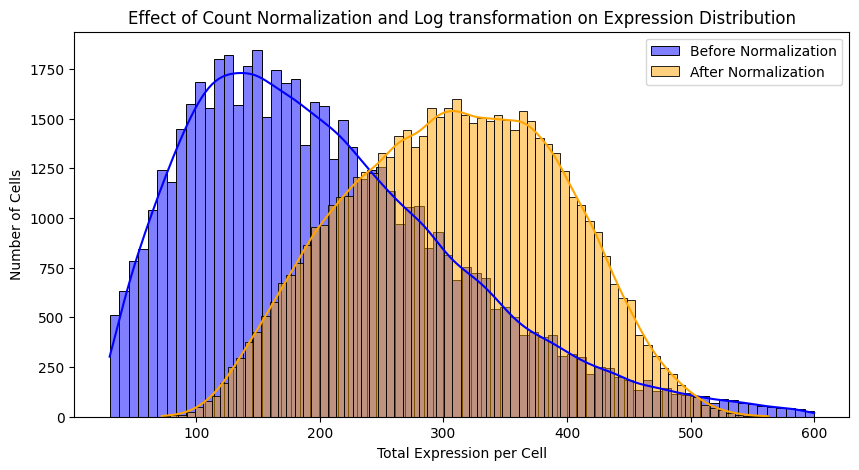

In [27]:
original_counts = adata.layers['raw'].sum(axis=1)
normalized_counts = adata.X.sum(axis=1)
# plot distributions
plt.figure(figsize=(10, 5))
sns.histplot(original_counts.A1, color="blue", label="Before Normalization", kde=True) 
sns.histplot(normalized_counts.A1, color="orange", label="After Normalization", kde=True)
plt.xlabel("Total Expression per Cell")
plt.ylabel("Number of Cells")
plt.title("Effect of Count Normalization and Log transformation on Expression Distribution")
plt.legend()
plt.show()

### 5.2 Pearson residuals normalization

Pearson residual normalization comes from the sctransform method known in the R-based tool Seurat, and was also described by Lause et al. in 2021 (https://genomebiology.biomedcentral.com/articles/10.1186/s13059-021-02451-7). This method models the gene expression counts using a negative binomial model and computes residuals, which are approximately variance-stabilized and centered around zero. This method is known to work well for large complex datasets with strong variation in total counts.

In [28]:
# revert back to raw counts
adata.X = adata.layers['raw'].copy()
# normalize using Pearson residuals
sc.experimental.pp.normalize_pearson_residuals(adata)
# convert back to a sparse matrix.
adata.X = sparse.csr_matrix(adata.X.copy())
# save the pearson residual normalized data in a separate layer
adata.layers['pearson'] = adata.X.copy()

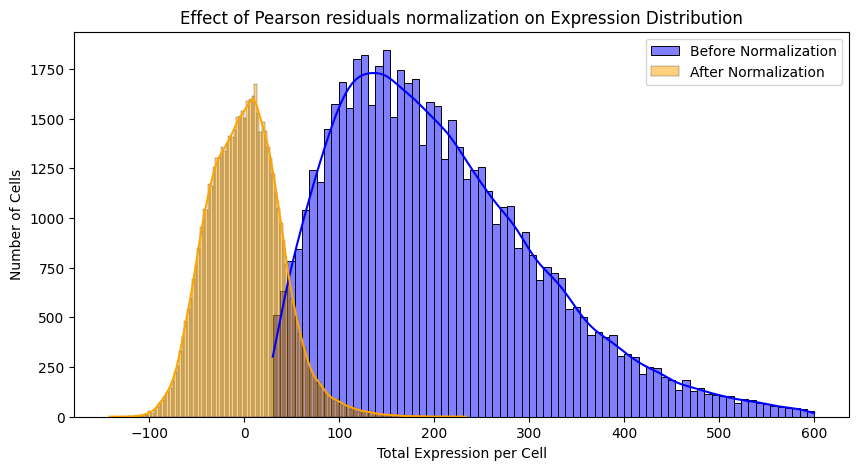

In [29]:
normalized_counts = adata.X.sum(axis=1)
# plot distributions
plt.figure(figsize=(10, 5))
sns.histplot(original_counts.A1, color="blue", label="Before Normalization", kde=True) 
sns.histplot(normalized_counts.A1, color="orange", label="After Normalization", kde=True)
plt.xlabel("Total Expression per Cell")
plt.ylabel("Number of Cells")
plt.title("Effect of Pearson residuals normalization on Expression Distribution")
plt.legend()
plt.show()

### 5.3 Cell size based normalization

Normalization on cell area corrects for differences due to cell size or segmentation bias. Larger cells capture more mRNA resulting in higher total counts, whereas in smaller cells often less transcripts are detected. This difference could be technical rather than biological. If we divide the expression levels by cell area, we express the transcript levels per area rather than cell.

In [30]:
# revert back to raw counts
adata.X = adata.layers['raw'].copy()
# normalization using cell area
Xnorm = np.divide(adata.X.todense().T, adata.obs['cell_area'].values).T * 1000
# logtransformation
Xnorm = np.log1p(Xnorm)
# convert back to a sparse matrix.
adata.X = sparse.csr_matrix(Xnorm.copy())
# save the cell area normalized data in a separate layer
adata.layers['size'] = adata.X.copy()

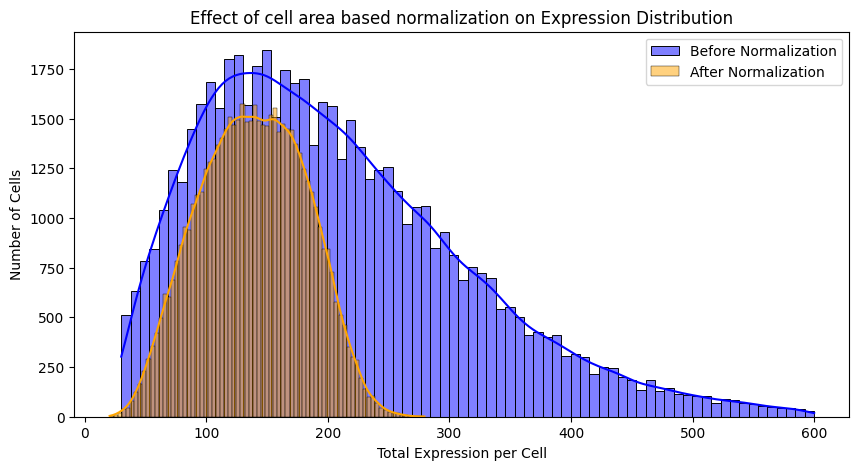

In [31]:
normalized_counts = adata.X.sum(axis=1)
# plot distributions
plt.figure(figsize=(10, 5))
sns.histplot(original_counts.A1, color="blue", label="Before Normalization", kde=True) 
sns.histplot(normalized_counts.A1, color="orange", label="After Normalization", kde=True)
plt.xlabel("Total Expression per Cell")
plt.ylabel("Number of Cells")
plt.title("Effect of cell area based normalization on Expression Distribution")
plt.legend()
plt.show()

## 6. Dimensionality reduction and clustering

We use dimensionality reduction, clustering, and visualization techniques to analyze the structure of our dataset, group similar cells, and visualize their relationships. Here, we borrow a lot of the methods that are used in scRNAseq analysis. 

First, we apply Principal Component Analysis (PCA) to reduce the high-dimensional gene expression data into a smaller set of principal components, retaining the main patterns of variation while reducing noise. 

Second, we create a neighbors graph, which identifies connections between cells based on their similarity in the reduced PCA space, capturing local relationships essential for clustering.

Third, using the Leiden clustering algorithm, we group cells into clusters based on these connections, allowing us to identify groups of similar cells that may represent distinct cell types or states. 

Finally, we apply UMAP (Uniform Manifold Approximation and Projection), a technique that reduces the data to two dimensions for visualization, preserving both local and global structures in the data. We generate a UMAP plot with cells colored by their assigned clusters, providing an overview of the dataset's structure and making it easy to spot distinct cell populations or clusters. This visualization gives us an interpretable view of the relationships within our data, helping us understand its organization before further analysis.

We will execute these steps on the differently normalized expression count matrices as well as the raw data to compare the effects of different normalization strategies.

/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:245: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")
/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/neighbors/__init__.py:430: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if "X_diffmap" in adata.obsm_keys():
/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_1038681/3409012080.py:5: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve t

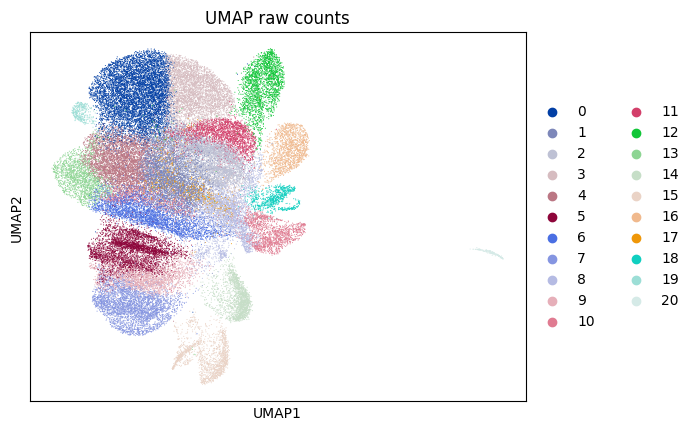

In [32]:
# Dimensionality reduction and clustering on the raw counts
adata.X = adata.layers['raw']
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)
adata.obsm['umap_raw'] = adata.obsm['X_umap']
adata.obs['leiden_raw'] = adata.obs['leiden']
sc.pl.umap(adata, color='leiden', title='UMAP raw counts')


/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:245: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")
/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/neighbors/__init__.py:430: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if "X_diffmap" in adata.obsm_keys():


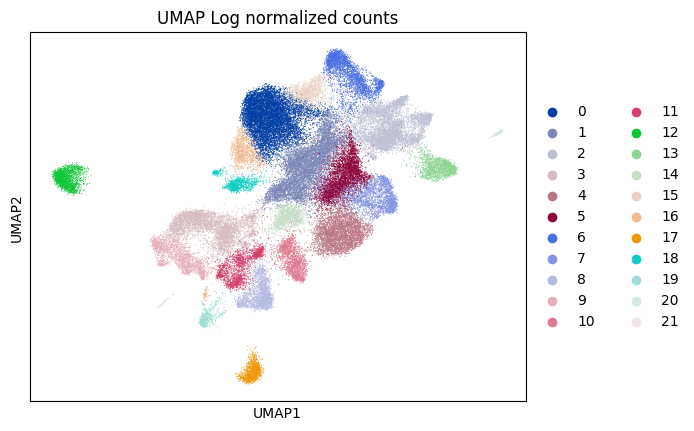

In [33]:
# Dimensionality reduction and clustering on the log normalized counts
adata.X = adata.layers['lognorm']
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)
adata.obsm['umap_lognorm'] = adata.obsm['X_umap']
adata.obs['leiden_lognorm'] = adata.obs['leiden']
sc.pl.umap(adata, color='leiden', title='UMAP Log normalized counts')

/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:245: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")
/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/neighbors/__init__.py:430: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if "X_diffmap" in adata.obsm_keys():


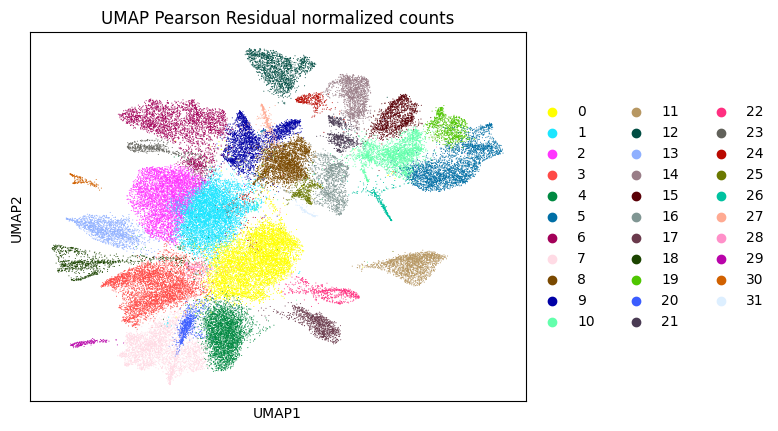

In [34]:
# Dimensionality reduction and clustering on the pearson residual normalized counts
adata.X = adata.layers['pearson']
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)
adata.obsm['umap_pearson'] = adata.obsm['X_umap']
adata.obs['leiden_pearson'] = adata.obs['leiden']
sc.pl.umap(adata, color='leiden', title='UMAP Pearson Residual normalized counts')

/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:245: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")
/home/myrthe/miniforge3/envs/practical_2/lib/python3.12/site-packages/scanpy/neighbors/__init__.py:430: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if "X_diffmap" in adata.obsm_keys():


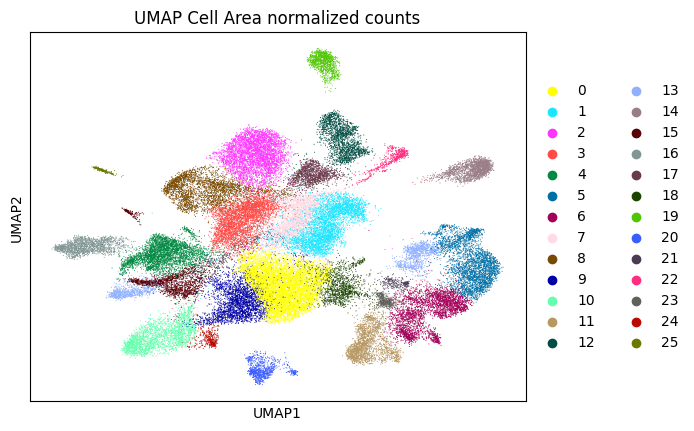

In [35]:
# Dimensionality reduction and clustering on the cell area normalized counts
adata.X = adata.layers['size']
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)
adata.obsm['umap_size'] = adata.obsm['X_umap']
adata.obs['leiden_size'] = adata.obs['leiden']
sc.pl.umap(adata, color='leiden', title='UMAP Cell Area normalized counts')

Now we can plot them all together and compare the effect of normalization on the clustering. First we plot them using the labels of their individual clustering results.

<Axes: title={'center': 'UMAP Cell Area normalized counts'}, xlabel='umap_size1', ylabel='umap_size2'>

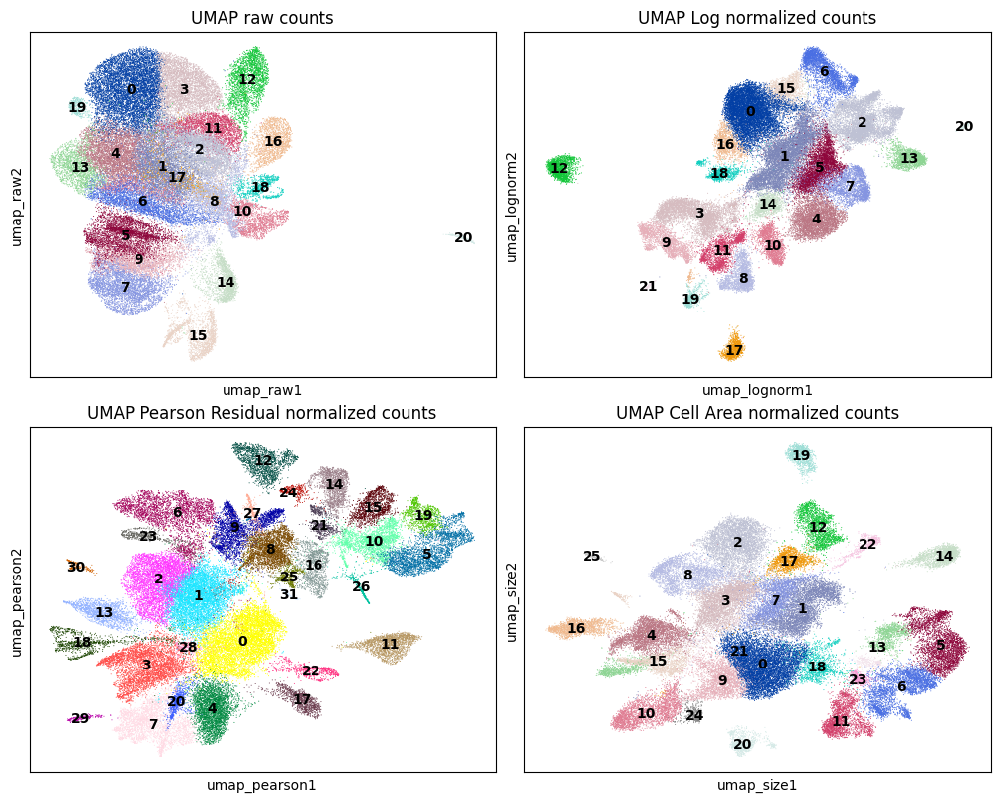

In [36]:
fig, axs = plt.subplots(2, 2, figsize=(10,8),constrained_layout=True)
sc.pl.embedding(adata, color='leiden_raw', basis='umap_raw', title='UMAP raw counts', ax=axs[0,0], show=False, legend_loc='on data')
sc.pl.embedding(adata, color='leiden_lognorm', basis='umap_lognorm', title='UMAP Log normalized counts', ax=axs[0,1], show=False, legend_loc='on data') 
sc.pl.embedding(adata, color='leiden_pearson', basis='umap_pearson', title='UMAP Pearson Residual normalized counts', ax=axs[1,0], show=False, legend_loc='on data')
sc.pl.embedding(adata, color='leiden_size', basis='umap_size', title='UMAP Cell Area normalized counts', ax=axs[1,1], show=False, legend_loc='on data')

To get a better idea of how the same cells are shifting place in the UMAPs after different normalization strategies, we can also plot them using the same clustering labels. In this case we will use those of clustering after Log normalization.

<Axes: title={'center': 'UMAP Cell Area normalized counts'}, xlabel='umap_size1', ylabel='umap_size2'>

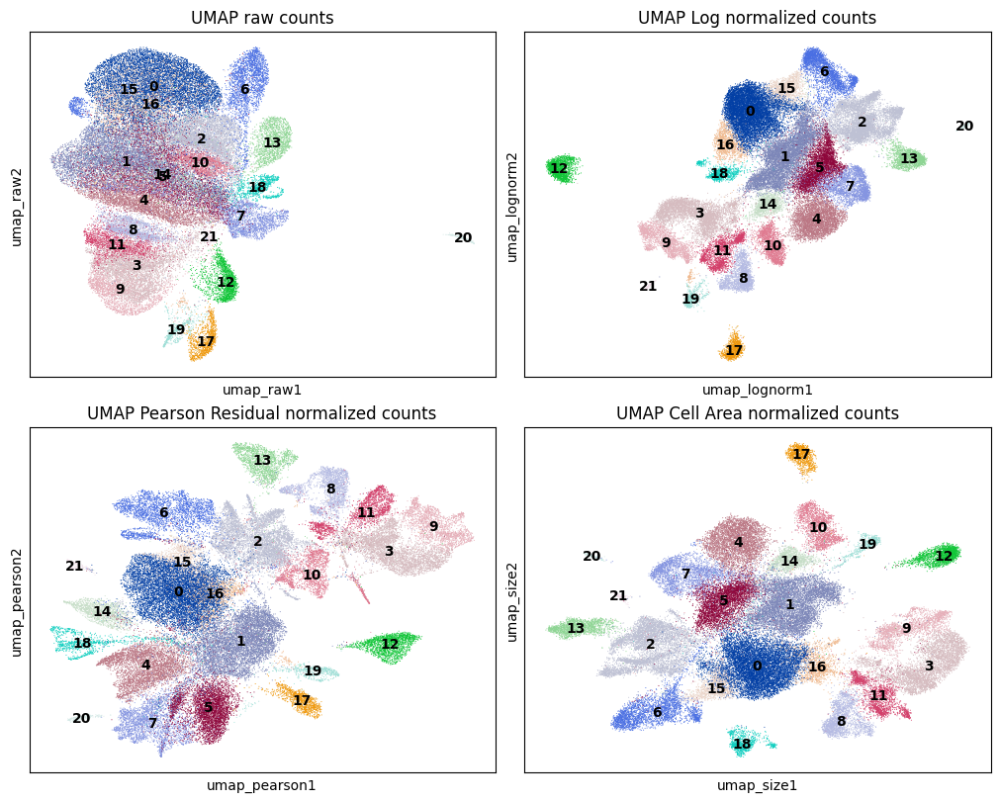

In [37]:
# all with clustering from lognorm coloring.
fig, axs = plt.subplots(2, 2, figsize=(10,8),constrained_layout=True)
sc.pl.embedding(adata, color='leiden_lognorm', basis='umap_raw', title='UMAP raw counts', ax=axs[0,0], show=False, legend_loc='on data')
sc.pl.embedding(adata, color='leiden_lognorm', basis='umap_lognorm', title='UMAP Log normalized counts', ax=axs[0,1], show=False, legend_loc='on data') 
sc.pl.embedding(adata, color='leiden_lognorm', basis='umap_pearson', title='UMAP Pearson Residual normalized counts', ax=axs[1,0], show=False, legend_loc='on data')
sc.pl.embedding(adata, color='leiden_lognorm', basis='umap_size', title='UMAP Cell Area normalized counts', ax=axs[1,1], show=False, legend_loc='on data')

Compare the UMAP plots from different normalization strategies. What differences can you spot in the UMAP plots? What do you think is the best normalization method for this dataset and why?

Regardless of the normalization method, we have more distinct clusters after normalization compared to the raw counts. To a large degree, the clusters agree between methods, but there are also regions where the clustering may differ. Cluster 1 in the log normalized dataset is split into clusters 2, 6 and 30 in the Pearson Residuals normalized dataset for example.

We can also visualize the clustering results onto the sections.

/tmp/ipykernel_1038681/2413668323.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='leiden_raw', spot_size=15, title="Raw counts", palette = adata.uns['leiden_pearson_colors'], show=False, ax=axes[0, 0])
/tmp/ipykernel_1038681/2413668323.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='leiden_lognorm', spot_size=15, title="Log normalized counts", palette = adata.uns['leiden_pearson_colors'], show=False, ax=axes[0, 1])
/tmp/ipykernel_1038681/2413668323.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='leiden_pearson', spot_size=15, title="Pearson Residual normalized counts", show=False, ax=axes[1, 0])
/tmp/ipykernel_1038681/2413668323.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='leiden_size', spot_size=15, title="Cell Area normalized counts", palette = adata.uns['leiden_pearson_colors'], show=False, ax=axes[1,1]

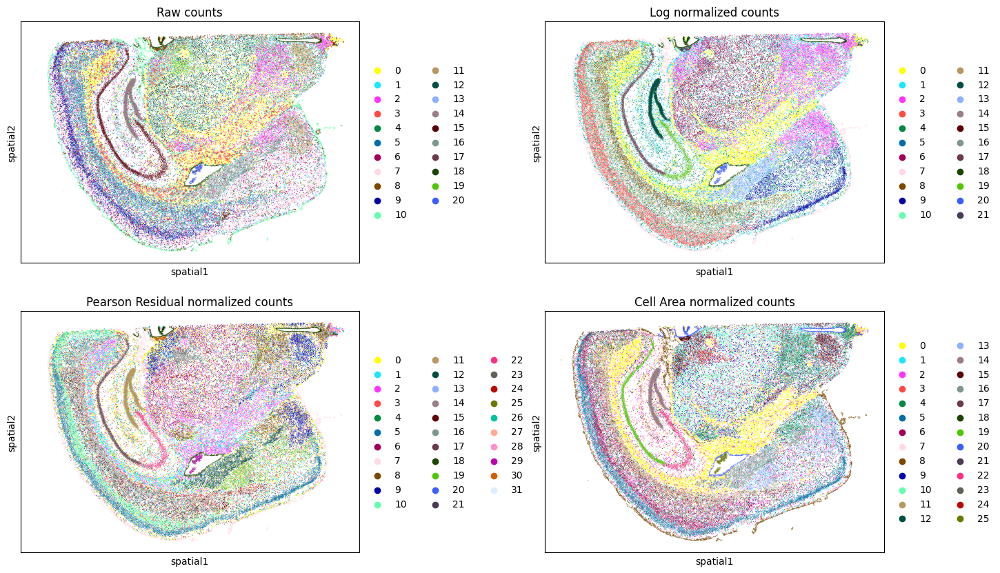

In [38]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))
# plot all with same colors to make more comparable.
sc.pl.spatial(adata, color='leiden_raw', spot_size=15, title="Raw counts", palette = adata.uns['leiden_pearson_colors'], show=False, ax=axes[0, 0])
sc.pl.spatial(adata, color='leiden_lognorm', spot_size=15, title="Log normalized counts", palette = adata.uns['leiden_pearson_colors'], show=False, ax=axes[0, 1])
sc.pl.spatial(adata, color='leiden_pearson', spot_size=15, title="Pearson Residual normalized counts", show=False, ax=axes[1, 0])
sc.pl.spatial(adata, color='leiden_size', spot_size=15, title="Cell Area normalized counts", palette = adata.uns['leiden_pearson_colors'], show=False, ax=axes[1,1])

plt.show()

It looks like we have better separation of the cortical layers after using Size or Pearson normalization.

Note: Some downstream methods specifically expect log-normalized input, limiting this choice of normalization method.

## 7. Marker gene identification
Finally, we can further interpret our clusters by identifying marker genes for each cluster. These marker genes are helpful for identifying which cell-types are present in our dataset. For now, we will focus on the Pearson Residual normalized dataset, but you can look into the other normalization methods as well if you have time.

We will use the Scanpy function `sc.tl.rank_genes_groups` to perform a differential expression analysis between clusters and the `sc.pl.rank_genes_groups_heatmap` function to visualize the results. Since we have a high number of clusters, we will visualize one marker gene per cluster, but there should be more.

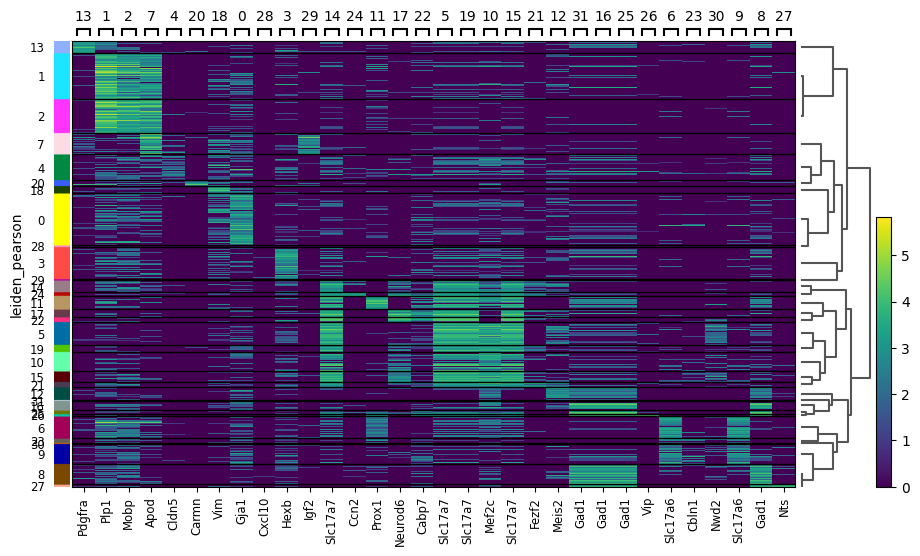

In [39]:
%%capture --no-display
sc.tl.rank_genes_groups(adata, "leiden_pearson")
sc.pl.rank_genes_groups_heatmap(adata, n_genes=1, groupby="leiden_pearson")


As you can see, some top markers are unique for one cluster such as the Igf2 gene in cluster 10. Ifg2 (Insulin-like Growth Factor 2) is predominantly expressed by pericytes and fibroblasts, so it could be that cluster 10 represents one of these celltypes.

Other markers are less unique, Gad1 for example is identified as top marker for clusters 18, 27, 5 and 33. Gad1 encodes for an enzyme producing the GABA neurotransmitter and is expressed in a wide variety of neurons in various brain regions.

If we visualize these genes on the section, we als see that Igf2 is more localized to the outer cortical layer, whereas Gad1 expression is spread across multiple parts of the tissue.

/tmp/ipykernel_1038681/393484508.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=['Igf2', 'Gad1'], spot_size=10, cmap='viridis_r')


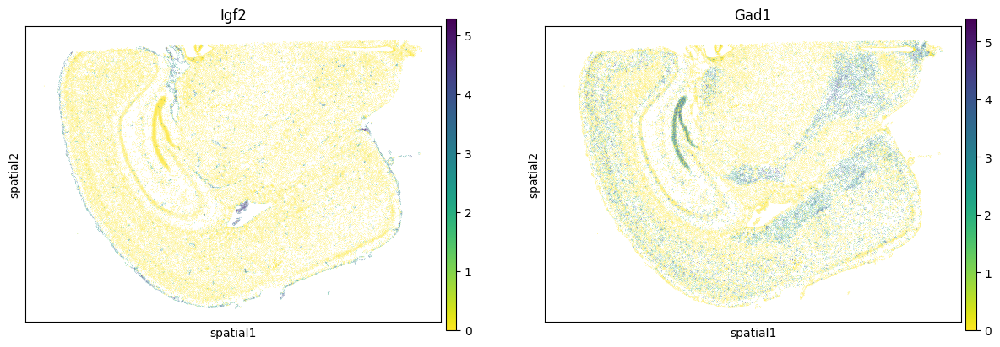

In [40]:
sc.pl.spatial(adata, color=['Igf2', 'Gad1'], spot_size=10, cmap='viridis_r')

In real analyses, the next step would be cell-type annotation, where biological identities are assigned to the clusters based on their gene expression patterns. This can involve the following:
- Compare marker genes to known cell-type markers from public databases (e.g. PanglaoDB) or single-cell or spatial transcriptomics atlases (e.g. Human Cell Atlas)
- Integrate prior biological knowledge of the tissue
- Apply computational methods (e.g. SingleR)

Accurate annotation is a complex and time-consuming process and is therefore outside the scope of this practical.